# Rotated Camera Jigsaw Puzzle

In [350]:
from PIL import Image, ImageOps,ImageFilter  # this contain the image class and methods from PIL library
import numpy as np # this imports the numerical and array library 
import matplotlib.pyplot as plt # this is for plotting (showing) images 
import cv2
from sklearn import *
from scipy.ndimage import filters
data_dir = '/Users/haritharash/Desktop/warwick/class/Image_&_Video_Analysis/coursework/data/'

puzzle_4 = np.array(Image.open(data_dir + 'pieces-4.jpg').convert('RGB')) 
puzzle_5 = np.array(Image.open(data_dir + 'pieces-5.jpg').convert('RGB'))
puzzle_6 = np.array(Image.open(data_dir + 'pieces-6.jpg').convert('RGB'))

def showpic(image, width=10):
  plt.figure(figsize=(width, width/1000*727))
  plt.imshow(image, cmap='gray')
  plt.axis('off')
  plt.show()

def showlist(tiles, width=10,col=5):
  n_rows = np.ceil(len(tiles)/col).astype('int')
  plt.subplots(n_rows, col, figsize=(width, width))
  for i in range(len(tiles)):
    plt.subplot(n_rows, col, i+1)
    plt.axis('off')
    plt.title(str(i))
    plt.imshow(tiles[i])
  plt.show()
  
def apply_brightness_contrast(input_img, brightness = 0, contrast = 0):
    
    if brightness != 0:
        if brightness > 0:
            shadow = brightness
            highlight = 255
        else:
            shadow = 0
            highlight = 255 + brightness
        alpha_b = (highlight - shadow)/255
        gamma_b = shadow
        
        buf = cv2.addWeighted(input_img, alpha_b, input_img, 0, gamma_b)
    else:
        buf = input_img.copy()
    
    if contrast != 0:
        f = 131*(contrast + 127)/(127*(131-contrast))
        alpha_c = f
        gamma_c = 127*(1-f)
        
        buf = cv2.addWeighted(buf, alpha_c, buf, 0, gamma_c)

    return buf


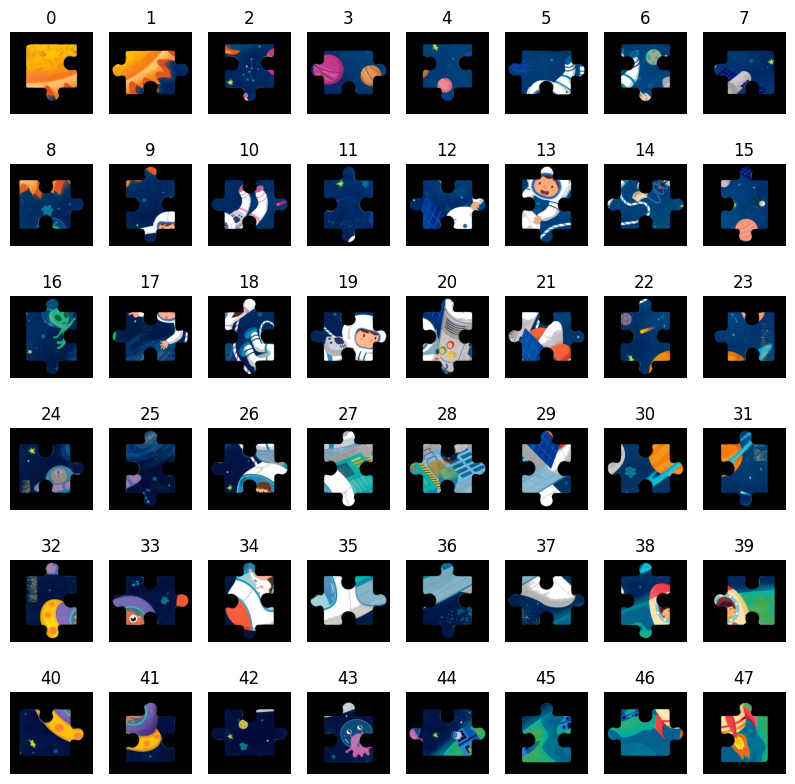

In [351]:
%store -r all_puzzle
all_puzzle = all_puzzle

showlist(all_puzzle,col=8)

## Image Pre - Processing for puzzle (4,5,6)
Process:
* Increase contrast fof the image
* Thresholding and Blurring
* Extracting Pieces

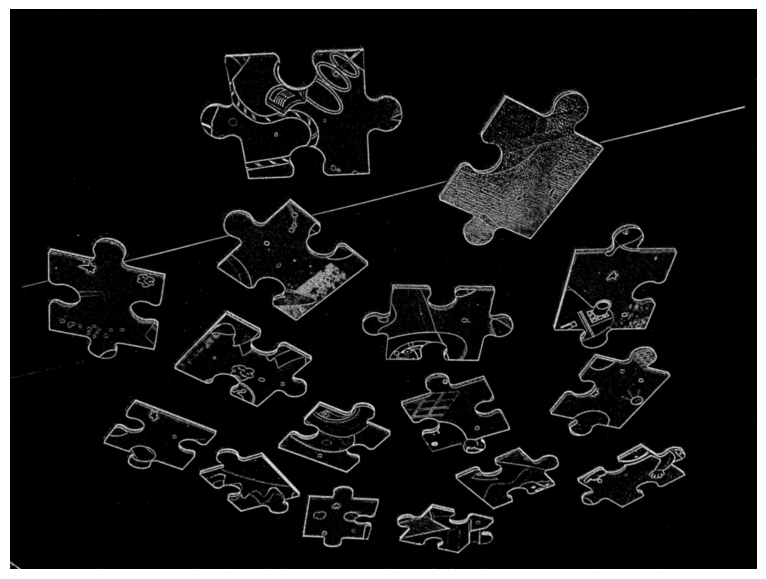

/var/folders/8r/7rhpzt7n08d24pwrzj7xcj7c0000gn/T/ipykernel_2016/2189795651.py:10: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  smooth = filters.median_filter(fill.astype('uint8'), size=30)


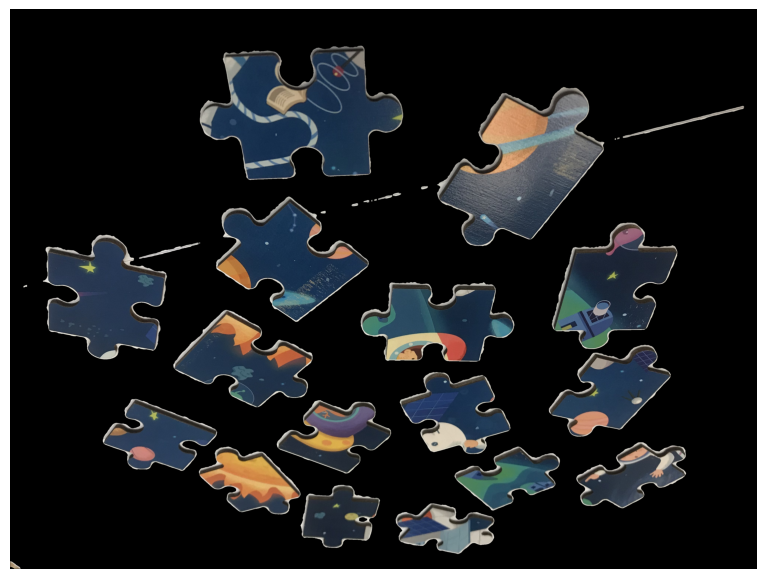

In [352]:
im_contrast4 = np.array(ImageOps.autocontrast(Image.fromarray(puzzle_4), cutoff = 0, ignore = 20))
gray = cv2.cvtColor(im_contrast4 , cv2.COLOR_BGR2GRAY)

thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,1,17, 4)
blurred = cv2.GaussianBlur(thresh, (9, 9), 3)
showpic(blurred)

contours, _ = cv2.findContours(blurred,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
fill = cv2.drawContours(np.zeros(puzzle_4.shape[:2]), contours, -1, 1, thickness=cv2.FILLED) 
smooth = filters.median_filter(fill.astype('uint8'), size=30) 
trim_contours, _ = cv2.findContours(smooth, 0, 1) 
cv2.drawContours(smooth, trim_contours, -1, color=0, thickness=1) 
im4_bg_removed = np.uint8(smooth[:,:,None]*im_contrast4)
showpic(im4_bg_removed)

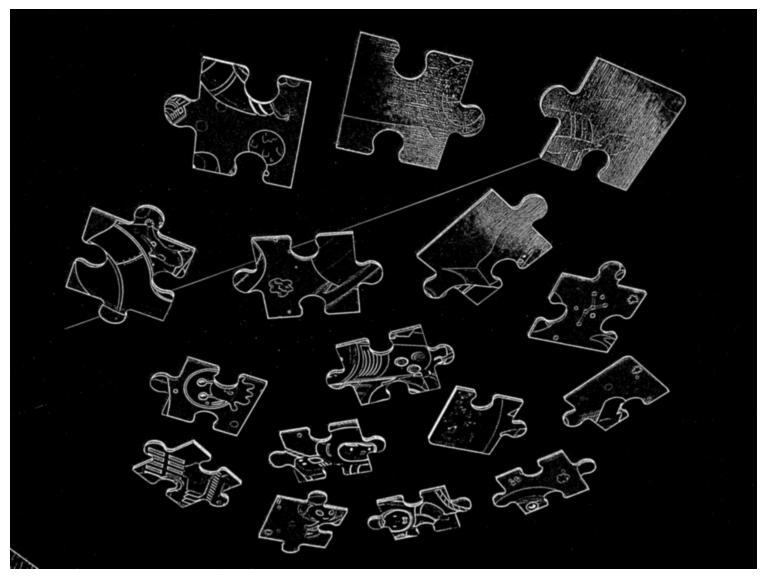

/var/folders/8r/7rhpzt7n08d24pwrzj7xcj7c0000gn/T/ipykernel_2016/722170767.py:10: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  smooth = filters.median_filter(fill.astype('uint8'), size=50)


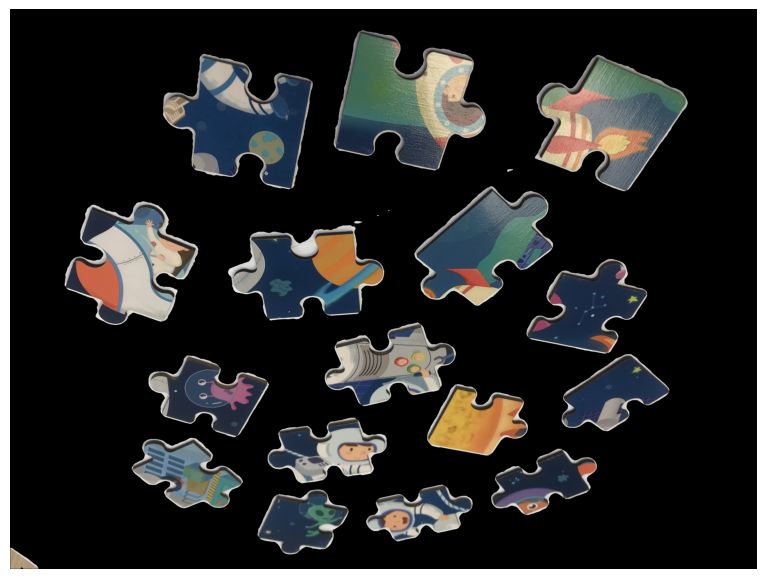

In [353]:
im_contrast5 = np.array(ImageOps.autocontrast(Image.fromarray(puzzle_5), cutoff = 0, ignore = 20))
gray = cv2.cvtColor(im_contrast5 , cv2.COLOR_BGR2GRAY)

thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,1,19, 4)
blurred = cv2.GaussianBlur(thresh, (15, 15), 3)
showpic(blurred)

contours, _ = cv2.findContours(blurred,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
fill = cv2.drawContours(np.zeros(puzzle_5.shape[:2]), contours, -1, 1, thickness=cv2.FILLED) 
smooth = filters.median_filter(fill.astype('uint8'), size=50) 
trim_contours, _ = cv2.findContours(smooth, 0, 1) 
cv2.drawContours(smooth, trim_contours, -1, color=0, thickness=1)
im5_bg_removed = np.uint8(smooth[:,:,None]*im_contrast5) 
showpic(im5_bg_removed)

/var/folders/8r/7rhpzt7n08d24pwrzj7xcj7c0000gn/T/ipykernel_2016/1528309823.py:11: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  smooth = filters.median_filter(fill.astype('uint8'), size=30)


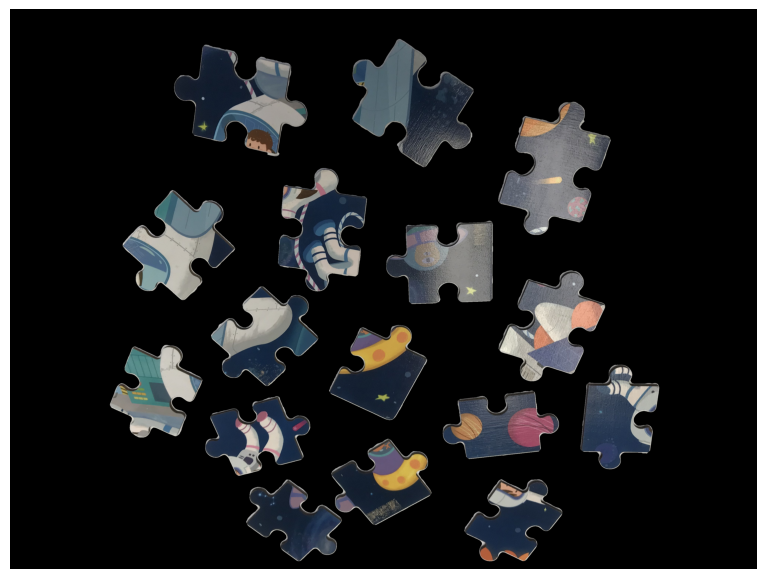

In [354]:
im_contrast6 = np.array(ImageOps.autocontrast(Image.fromarray(puzzle_6), cutoff = 0, ignore = 20))
gray = cv2.cvtColor(im_contrast6 , cv2.COLOR_BGR2GRAY)
# blurred = cv2.GaussianBlur(gray,  (3, 3), 2)
thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,1,21, 5)
blurred = cv2.GaussianBlur(thresh, (7, 7), 2)
# showpic(blurred)

contours, _ = cv2.findContours(blurred,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
fill = cv2.drawContours(np.zeros(puzzle_6.shape[:2]), contours, -1, 1, thickness=cv2.FILLED) 

smooth = filters.median_filter(fill.astype('uint8'), size=30) 
trim_contours, _ = cv2.findContours(smooth, 0, 1) 
cv2.drawContours(smooth, trim_contours, -1, color=0, thickness=1) 

im6_bg_removed = np.uint8(smooth[:,:,None]*im_contrast6)
showpic(im6_bg_removed)



# Image Enhancement - Tuning Brightness and Contrast

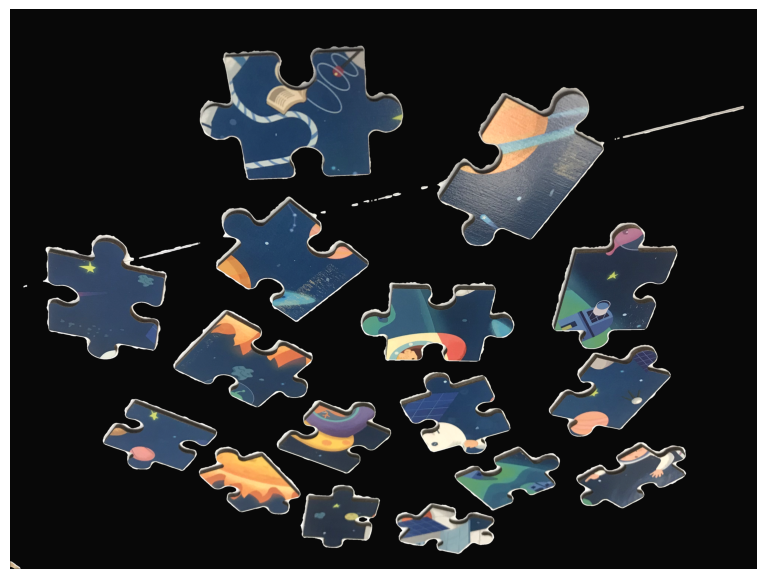

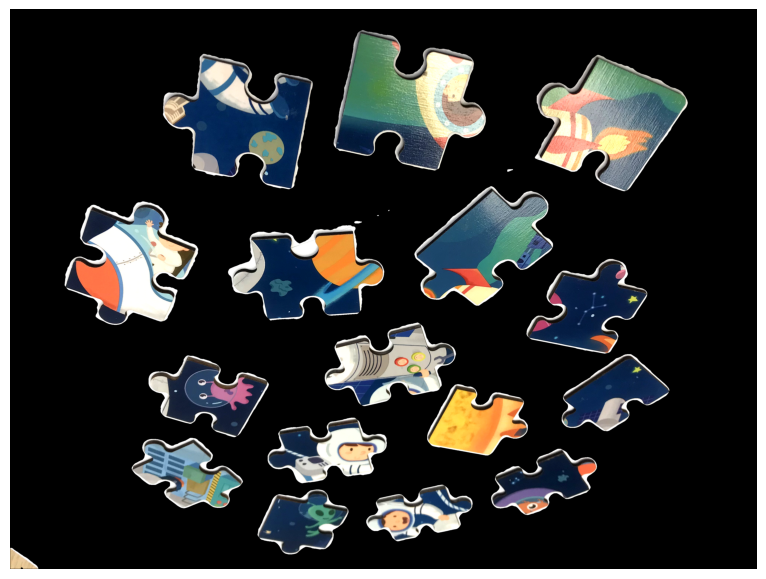

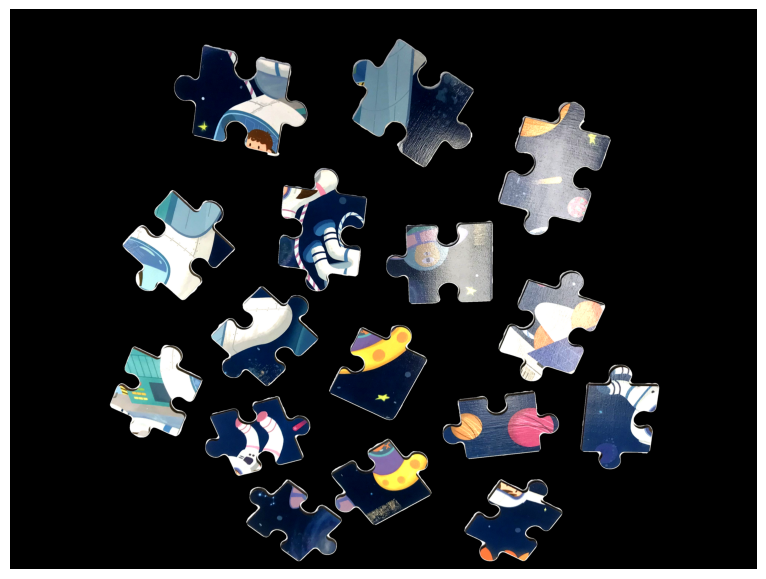

In [372]:
img4_enhanced = im4_bg_removed.copy()
img5_enhanced = im5_bg_removed.copy()
img6_enhanced = im6_bg_removed.copy()

img4_enhanced = apply_brightness_contrast(img4_enhanced,brightness=40,contrast=20)
img5_enhanced = apply_brightness_contrast(img5_enhanced,brightness=35,contrast=35)
img6_enhanced = apply_brightness_contrast(img6_enhanced,brightness=50,contrast=50)
showpic(img4_enhanced)
showpic(img5_enhanced)
showpic(img6_enhanced)

# Pieces extraction - Sift Feature Detection

In [356]:
all_match_puzzle = {}

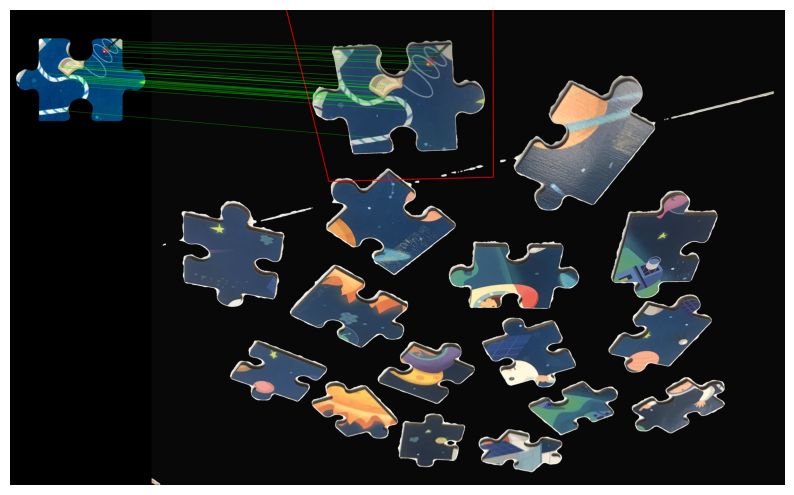

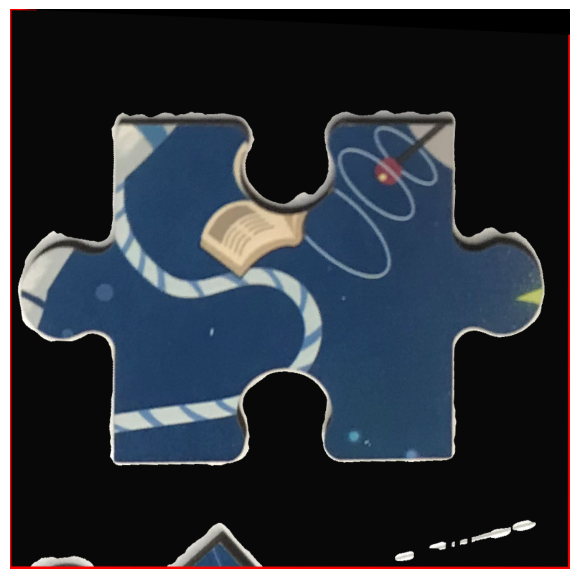

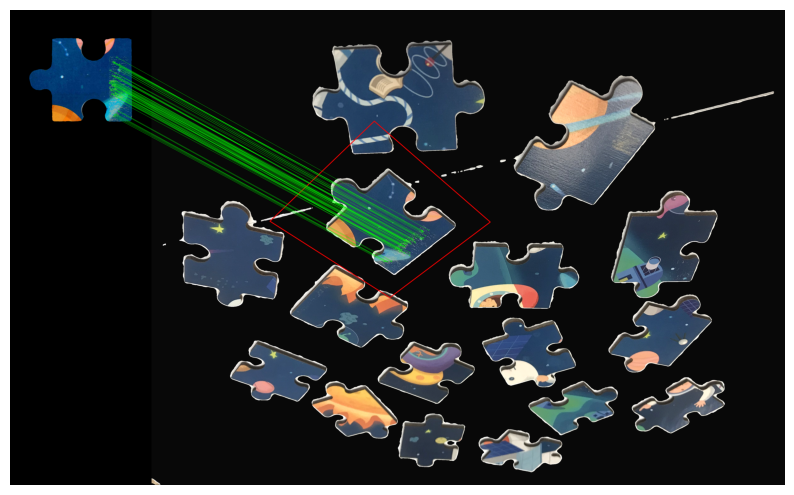

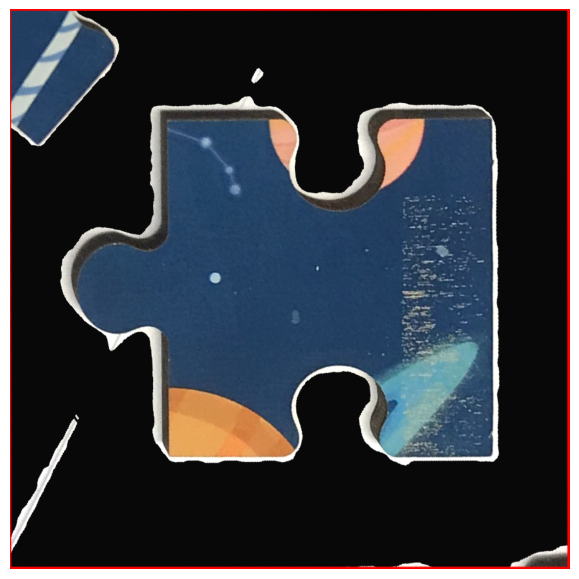

In [357]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

for index_puzzle,puzzle in enumerate(all_puzzle):
    
    sift = cv2.SIFT_create()
    img1 = cv2.cvtColor(puzzle.copy(),cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(img4_enhanced.copy(),cv2.COLOR_RGB2GRAY)

    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    matches = flann.knnMatch(des1,des2,k=2)
    matchesMask = [[0,0] for i in range(len(matches))]

    good = []
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.7 *n.distance:
            matchesMask[i]=[1,0]
            good.append(m)

    # print('num inliers are ', len(good))
    if len(good)>=40:
        # draw_params = dict(#matchColor = (0,255,0),
        #             singlePointColor = (255,120,0),
        #             matchesMask = matchesMask,
        #             flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS+
        #                     cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS) # don't draw lone points

        # matches_im = cv2.drawMatchesKnn(puzzle,kp1,img4_enhanced,kp2,matches,None,**draw_params)
        # showpic(matches_im)
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()
        h,w = img1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0]  ]).reshape(-1,1,2)

        dst = cv2.perspectiveTransform(pts,M)

        
        image = cv2.polylines(img4_enhanced.copy(),[np.int32(dst)],True,(255,0,0),3, cv2.LINE_AA)
    
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                singlePointColor = None,
                matchesMask = matchesMask, # draw only inliers
                flags = 2)

        matches_im = cv2.drawMatches(puzzle,kp1,image,kp2,good,None,**draw_params)
        showpic(matches_im)
        warp = cv2.warpPerspective(image, np.linalg.inv(M), (w,h))
        showpic(warp)
        all_match_puzzle[index_puzzle] = warp

num inliers are  38


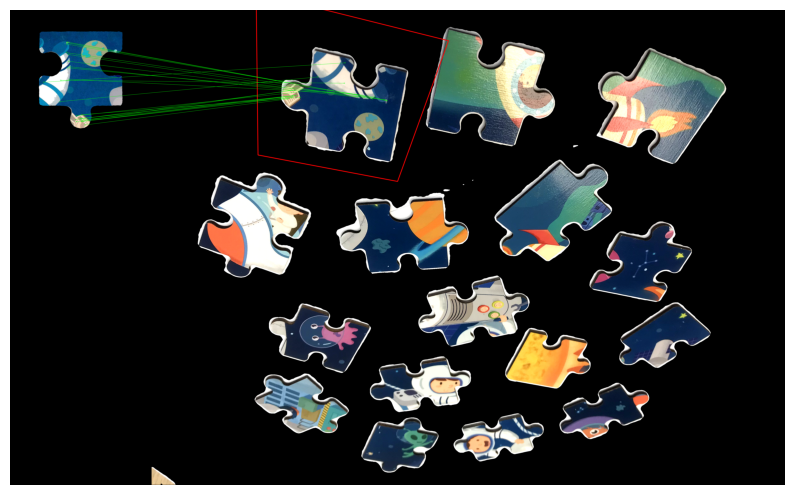

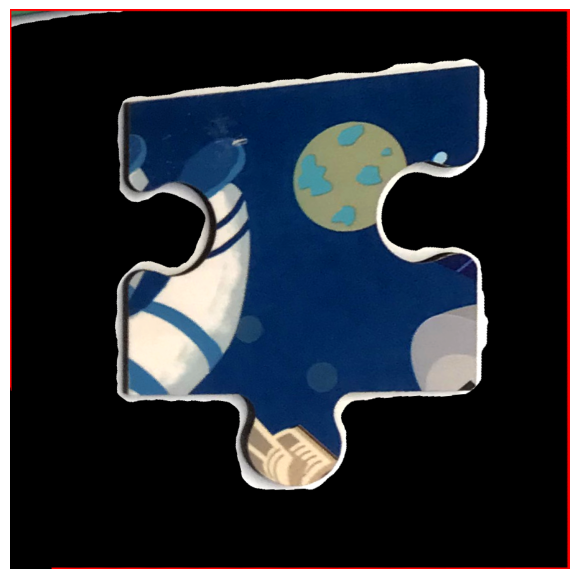

num inliers are  25


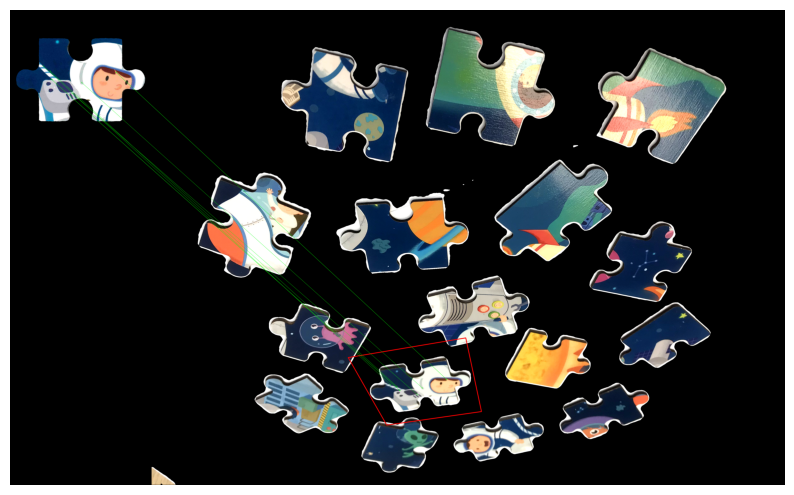

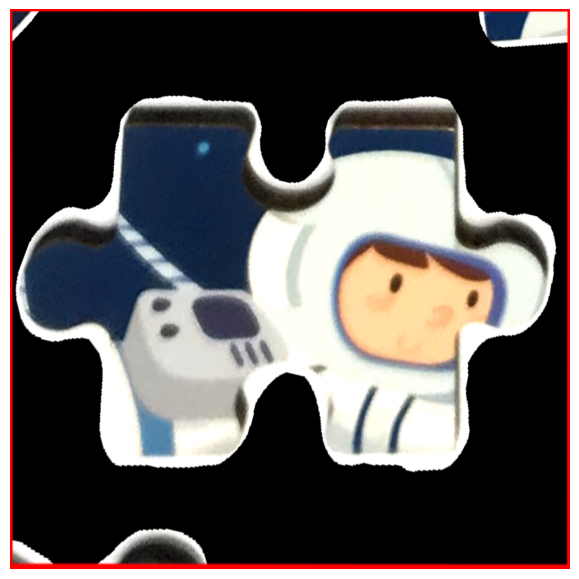

num inliers are  52


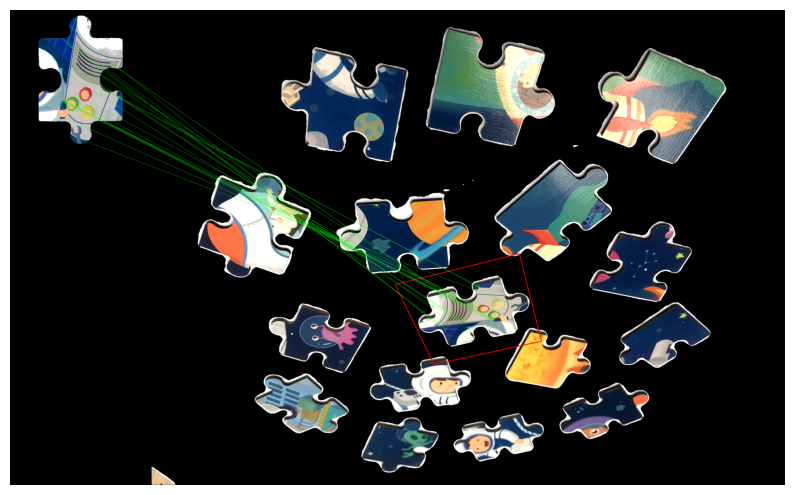

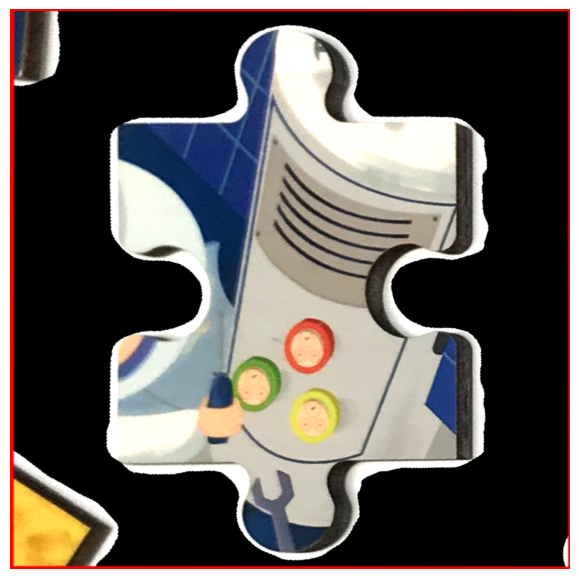

In [374]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)


for index_puzzle,puzzle in enumerate(all_puzzle):
    
    sift = cv2.SIFT_create()
    img1 = cv2.cvtColor(puzzle.copy(),cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(img5_enhanced.copy(),cv2.COLOR_RGB2GRAY)

    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    matches = flann.knnMatch(des1,des2,k=2)
    matchesMask = [[0,0] for i in range(len(matches))]

    good = []
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.68 *n.distance:
            matchesMask[i]=[1,0]
            good.append(m)

    
    if len(good)>= 25:
        print('num inliers are ', len(good))
        # draw_params = dict(#matchColor = (0,255,0),
        #             singlePointColor = (255,120,0),
        #             matchesMask = matchesMask,
        #             flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS+
        #                     cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS) # don't draw lone points

        # matches_im = cv2.drawMatchesKnn(puzzle,kp1,img5_enhanced,kp2,matches,None,**draw_params)
        # showpic(matches_im)
        
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()
        h,w = img1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0]  ]).reshape(-1,1,2)

        dst = cv2.perspectiveTransform(pts,M)

        
        image = cv2.polylines(img5_enhanced.copy(),[np.int32(dst)],True,(255,0,0),3, cv2.LINE_AA)
    
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                singlePointColor = None,
                matchesMask = matchesMask, # draw only inliers
                flags = 2)

        matches_im = cv2.drawMatches(puzzle,kp1,image,kp2,good,None,**draw_params)
        showpic(matches_im)
        warp = cv2.warpPerspective(image, np.linalg.inv(M), (w,h))
        showpic(warp)
        all_match_puzzle[index_puzzle] = warp

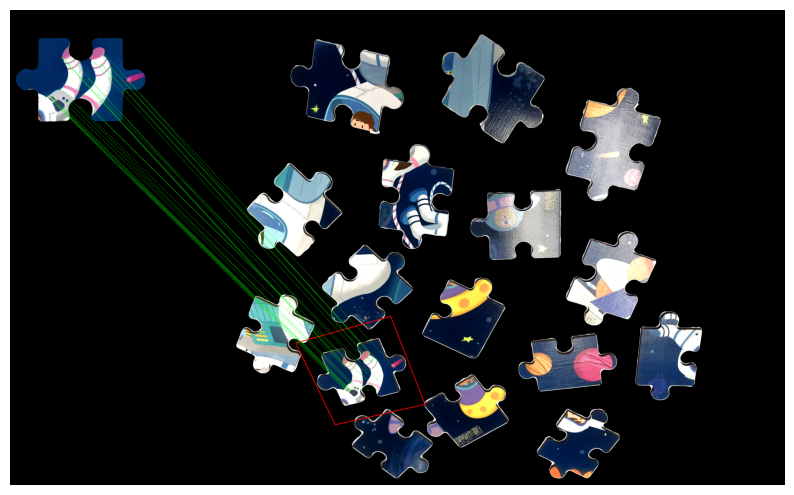

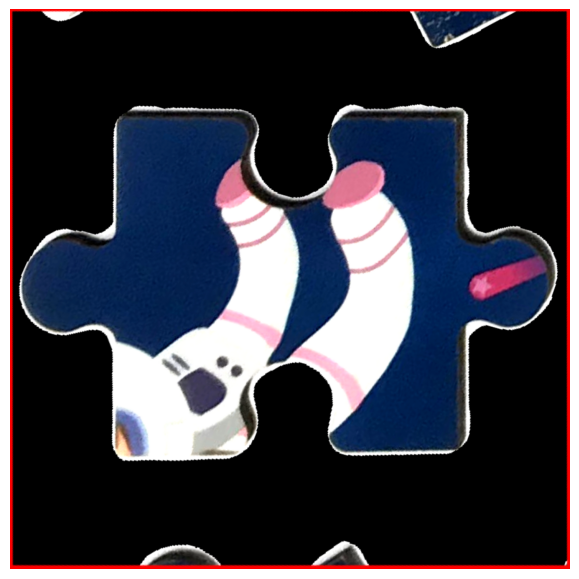

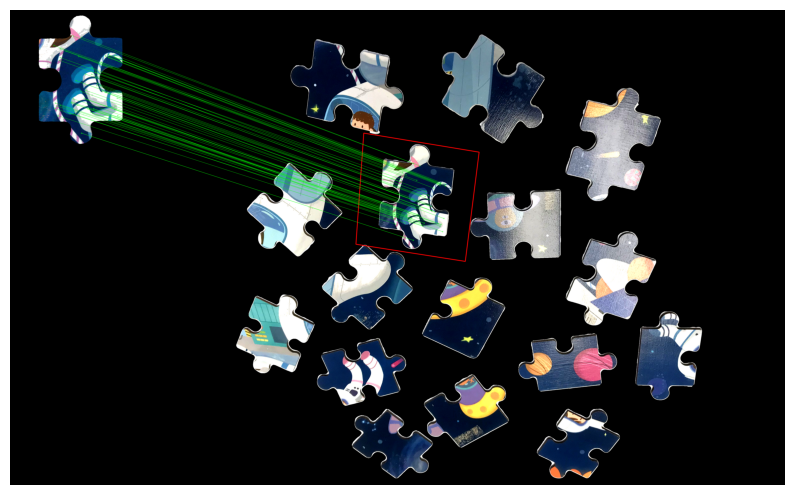

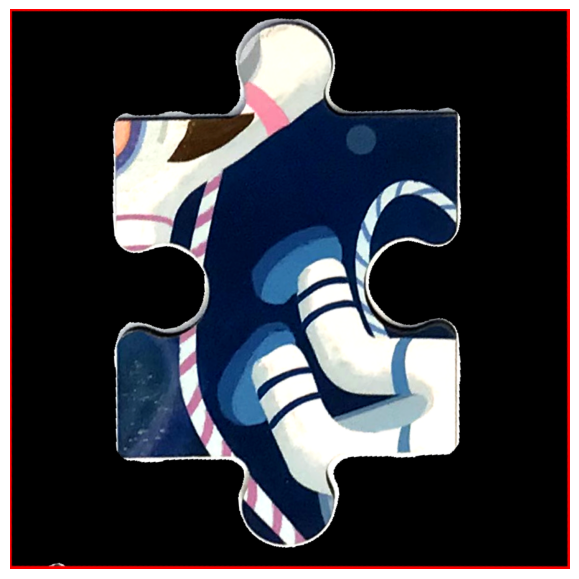

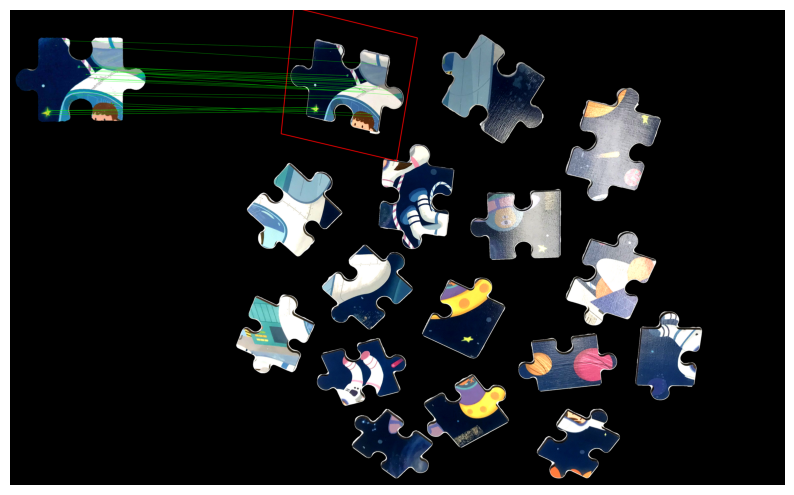

...

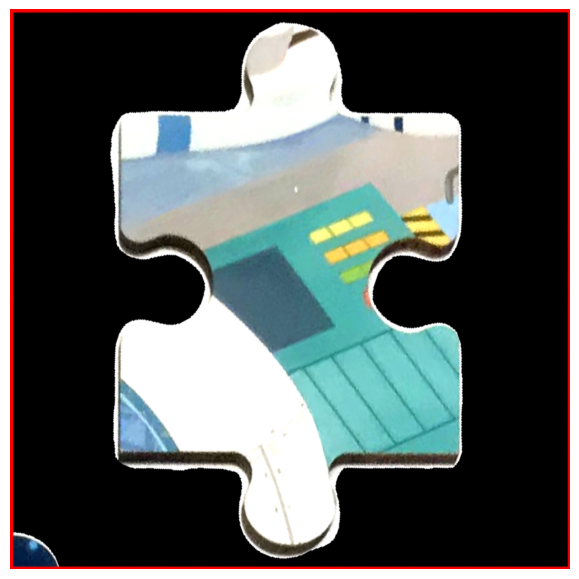

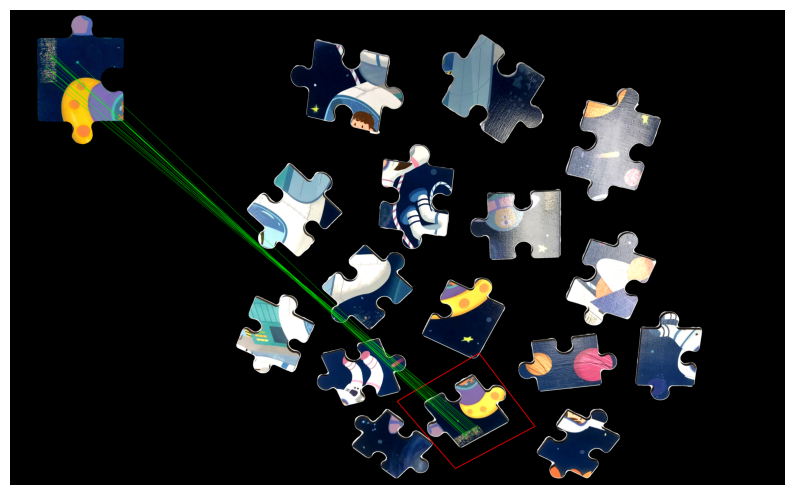

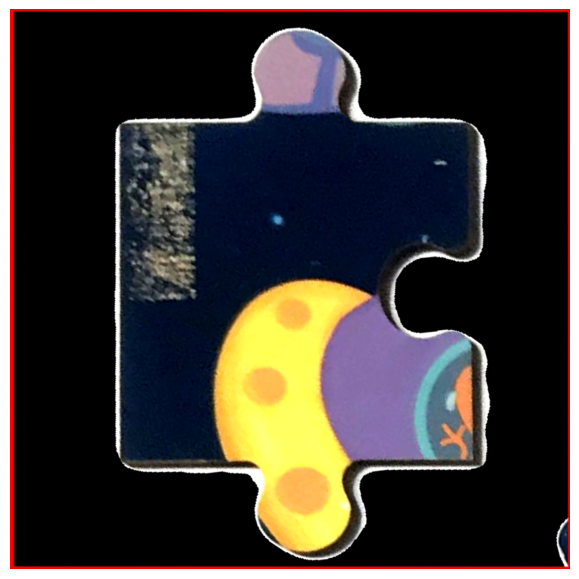

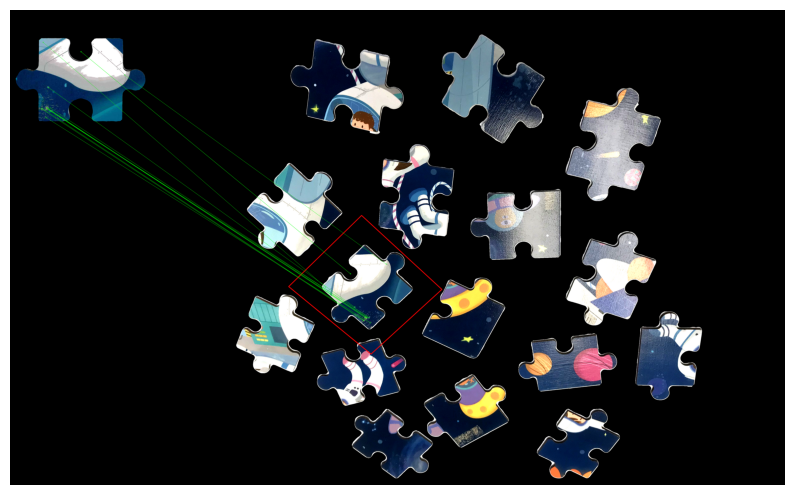

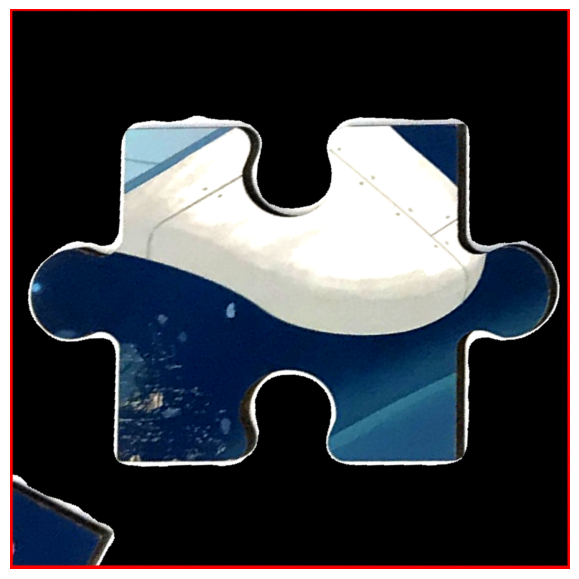

In [359]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

for index_puzzle,puzzle in enumerate(all_puzzle):
    
    sift = cv2.SIFT_create()
    img1 = cv2.cvtColor(puzzle.copy(),cv2.COLOR_RGB2GRAY)
    img2 = cv2.cvtColor(img6_enhanced.copy(),cv2.COLOR_RGB2GRAY)

    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    matches = flann.knnMatch(des1,des2,k=2)
    matchesMask = [[0,0] for i in range(len(matches))]

    good = []
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.7 *n.distance:
            matchesMask[i]=[1,0]
            good.append(m)

    # print('num inliers are ', len(good))
    if len(good)>=27:
        # draw_params = dict(#matchColor = (0,255,0),
        #             singlePointColor = (255,120,0),
        #             matchesMask = matchesMask,
        #             flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS+
        #                     cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS) # don't draw lone points

        # matches_im = cv2.drawMatchesKnn(puzzle,kp1,test,kp2,matches,None,**draw_params)
        # showpic(matches_im)
        
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        matchesMask = mask.ravel().tolist()
        h,w = img1.shape
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0]  ]).reshape(-1,1,2)

        dst = cv2.perspectiveTransform(pts,M)

        
        image = cv2.polylines(img6_enhanced.copy(),[np.int32(dst)],True,(255,0,0),3, cv2.LINE_AA)
    
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                singlePointColor = None,
                matchesMask = matchesMask, # draw only inliers
                flags = 2)

        matches_im = cv2.drawMatches(puzzle,kp1,image,kp2,good,None,**draw_params)
        showpic(matches_im)
        warp = cv2.warpPerspective(image, np.linalg.inv(M), (w,h))
    
        showpic(warp)
        all_match_puzzle[index_puzzle] = warp
    
    

# Puzzle Assembly

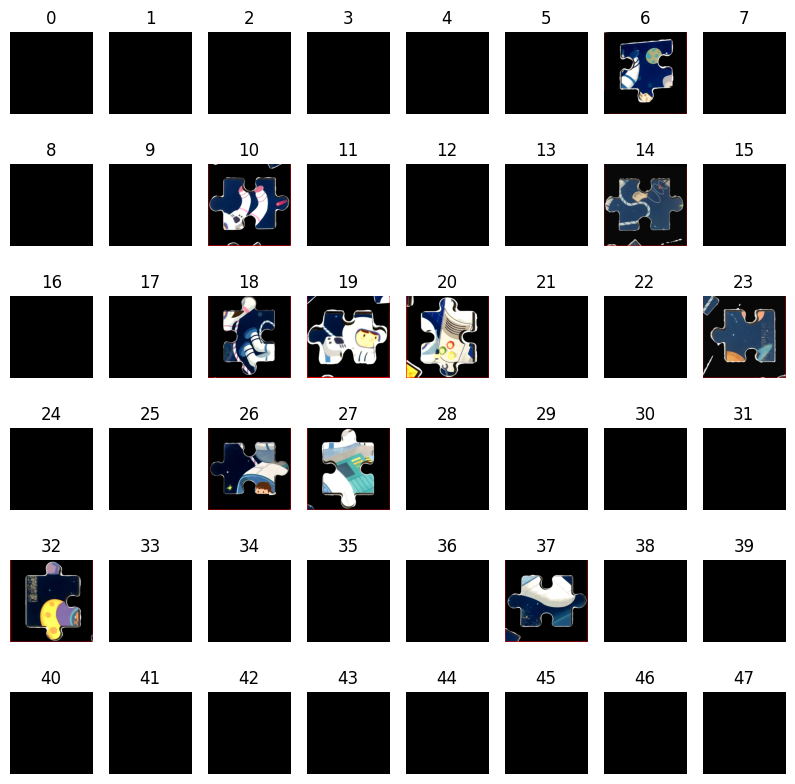

In [360]:

all_collected_puzzle = []
sum_row = 0
for i in range(6):
    row = []
    sum_col = 0
    for j in range(8):
        if sum_row+sum_col in all_match_puzzle:
            all_collected_puzzle.append(all_match_puzzle.get(sum_col+sum_row))
        else:
            all_collected_puzzle.append(np.zeros((900,900,3),np.uint8))
        sum_col= sum_col + 1
    sum_row = sum_row + 8

    
showlist(all_collected_puzzle,col=8)

# Future Suggestion Enhance Matching
Process:
* Find one piece puzzle in each image with sift feature detection,
* Increase the planar homography size.
* Find the new matrix with gerperspective function
* Warp the image

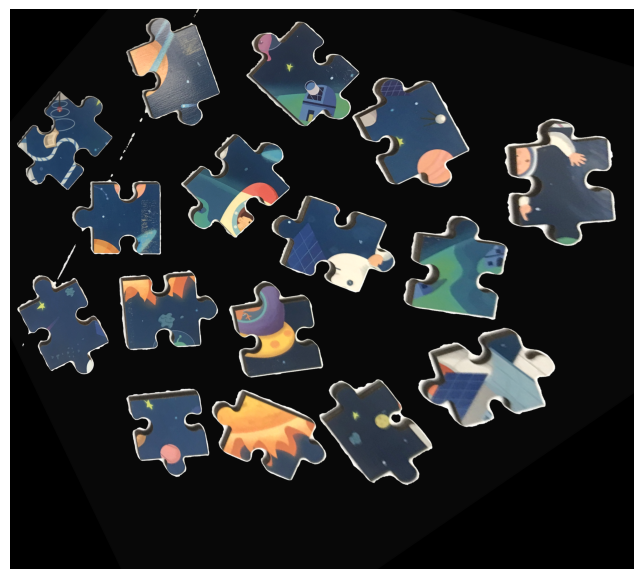

In [361]:

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

    
sift = cv2.SIFT_create()
img1 = cv2.cvtColor(all_puzzle[23].copy(),cv2.COLOR_RGB2GRAY)
img2 = cv2.cvtColor(img4_enhanced.copy(),cv2.COLOR_RGB2GRAY)

kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

matches = flann.knnMatch(des1,des2,k=2)
matchesMask = [[0,0] for i in range(len(matches))]

good = []
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7 *n.distance: 
        good.append(m)

# print('num inliers are ', len(good))

if len(good) > 30:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()
    h,w = img1.shape
    h = h + 3500
    w = w  + 4000
    pts = np.float32([ [-400,-1200],[-400,h-1-1200],[w-1-400,h-1-1200],[w-1-400,0-1200] ]).reshape(-1,1,2)

    dst = cv2.perspectiveTransform(pts,M)
    matrix = cv2.getPerspectiveTransform(dst,np.float32([ [0,0],[0,h],[w,h],[w,0] ]).reshape(-1,1,2))
    
    # cv2.polylines(img4_enhanced,[np.int32(dst)],True,(255,0,0),3, cv2.LINE_AA)
    
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                singlePointColor = None,
                matchesMask = matchesMask, # draw only inliers
                flags = 2)

    # matches_im = cv2.drawMatches(all_puzzle[23],kp1,img4_enhanced,kp2,good,None,**draw_params)
    # showpic(matches_im)

    warp_4 = cv2.warpPerspective(img4_enhanced, matrix, (w,h))
    showpic(warp_4)

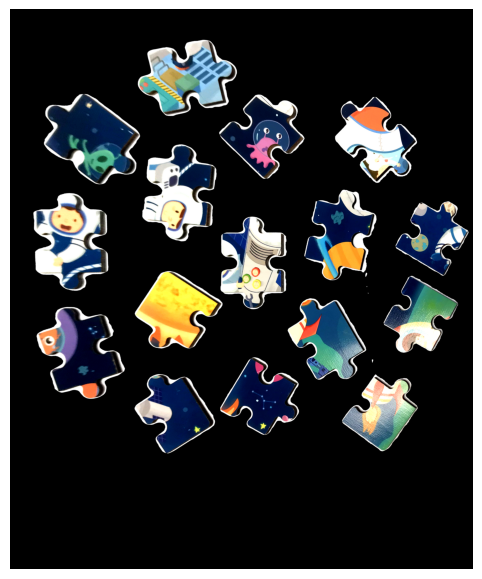

In [362]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

sift = cv2.SIFT_create()

img1 = cv2.cvtColor(all_puzzle[20].copy(),cv2.COLOR_RGB2GRAY)
img2 = cv2.cvtColor(img5_enhanced.copy(),cv2.COLOR_RGB2GRAY)

kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

matches = flann.knnMatch(des1,des2,k=2)

matchesMask = [[0,0] for i in range(len(matches))]

good = []
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7 *n.distance: 
        good.append(m)

# print('num inliers are ', len(good))

if len(good) > 30:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()
    h,w = img1.shape
    h = h + 4300 
    w = w  + 3400
    
    pts = np.float32([ [-1800,-1900],[-1800,h-1-1900],[w-1-1800,h-1-1900],[w-1-1800,-1900] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)
    matrix = cv2.getPerspectiveTransform(dst,np.float32([ [0,0],[0,h],[w,h],[w,0] ]).reshape(-1,1,2))
    
    # cv2.polylines(,[np.int32(dst)],True,(255,0,0),3, cv2.LINE_AA)
    
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                singlePointColor = None,
                matchesMask = matchesMask, # draw only inliers
                flags = 2)

    matches_im = cv2.drawMatches(all_puzzle[20],kp1,img5_enhanced,kp2,good,None,**draw_params)
    # showpic(matches_im)

    warp_5 = cv2.warpPerspective(img5_enhanced, matrix, (w,h))
    showpic(warp_5)

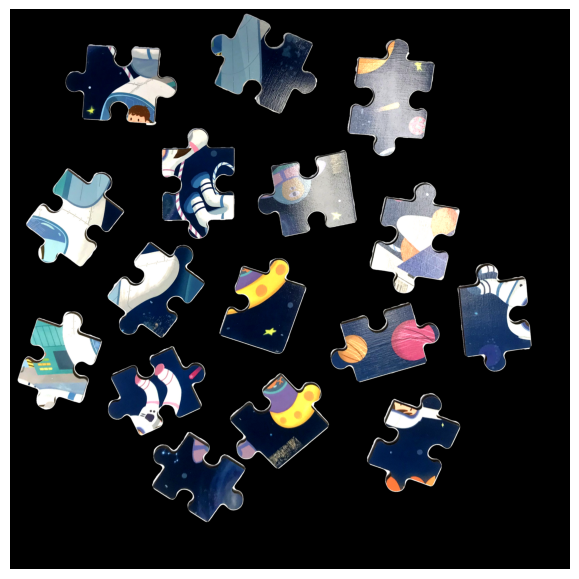

In [363]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)

sift = cv2.SIFT_create()
img1 = cv2.cvtColor(all_puzzle[18].copy(),cv2.COLOR_RGB2GRAY)
img2 = cv2.cvtColor(img6_enhanced.copy(),cv2.COLOR_RGB2GRAY)

kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

matches = flann.knnMatch(des1,des2,k=2)

matchesMask = [[0,0] for i in range(len(matches))]

good = []
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7 *n.distance: 
        good.append(m)

# print('num inliers are ', len(good))

if len(good) > 30:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()
    h,w = img1.shape
    h = h +3400
    w = w +3400
    
    pts = np.float32([ [-1000,-900],[-1000,h-1-900],[w-1-1000,h-1-900],[w-1-1000,-900]  ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)

    
    matrix = cv2.getPerspectiveTransform(dst,np.float32([ [0,0],[0,h],[w,h],[w,0] ]).reshape(-1,1,2))
    
    # cv2.polylines(img6_enhanced,[np.int32(dst)],True,(255,0,0),3, cv2.LINE_AA)
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                singlePointColor = None,
                matchesMask = matchesMask, # draw only inliers
                flags = 2)

    matches_im = cv2.drawMatches(all_puzzle[18],kp1,img6_enhanced,kp2,good,None,**draw_params)
    # showpic(matches_im)

    warp_6 = cv2.warpPerspective(img6_enhanced, matrix, (w,h))
    
    showpic(warp_6)